## Importing Libraries

In [1]:
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np

In [2]:
import os

In [3]:
from math import sqrt, pow, exp

## Image - Converting to .png

In [4]:
gif_path = "image.gif"
img_path = "image.png"

In [5]:
img = Image.open(gif_path).convert('L') #L stands for grayscale image

if os.path.exists(img_path):  
    print(f"Image already exists: {img_path}") 
else:
    img.save(img_path)
    print(f"Image saved: {img_path}")  

Image already exists: image.png


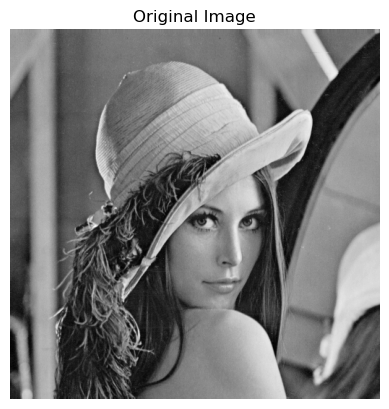

In [6]:
with Image.open(img_path) as im:
    plt.imshow(im,cmap="gray")
    plt.axis("off")
    plt.title("Original Image")
    plt.show()

In [7]:
type(im)

PIL.PngImagePlugin.PngImageFile

### Image as ndarray

In [8]:
img_ndarray = np.asarray(im)
print(img_ndarray)
print(f"Shape of the image is {img_ndarray.shape}")

[[162 162 162 ... 170 155 128]
 [162 162 162 ... 170 155 128]
 [162 162 162 ... 170 155 128]
 ...
 [ 43  43  50 ... 104 100  98]
 [ 44  44  55 ... 104 105 108]
 [ 44  44  55 ... 104 105 108]]
Shape of the image is (512, 512)


In [9]:
type(img_ndarray)

numpy.ndarray

# Defining Functions

In [10]:
def show_image(array,title=None):
    im = Image.fromarray(array)
    plt.imshow(im,cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()

In [11]:
def padding(img,filter_size):
    
    pad = (((filter_size)-1)//2)   #Calculating the padding needed from the filter size

    (ih,iw) = (img.shape)    #Store the image size for the loop
    (nh,nw) = (ih+(pad*2),iw+(pad*2))   #Image size after padding would be original_image_size + 2*padding - since padding is done on both the sides.
    
    p = np.zeros((nh, nw))  #Result array to store 0 values. Original image will be pasted on this.
    for i in range(0,ih):   #Loop for height
        for j in range(0,iw):   #Loop for width
            p[i+pad][j+pad]=img[i][j]  #Padded Image.
    return p
    

In [12]:
def conv(filter_matrix,img_ndarray):
    filter_size = filter_matrix.shape[0]  
    pad = ((filter_size)-1)//2  #Calculating the padding 
    padded_img = padding(img_ndarray,filter_size)  #performing the padding
    conv_img = np.zeros(img_ndarray.shape)    #array of zeros of size of original image
    for i in range(pad,padded_img.shape[0]-pad):  #Loop for height
        for j in range(pad,padded_img.shape[1]-pad):  #Loop for width
            g = padded_img[i-pad:i+pad+1,j-pad:j+pad+1]  # Extracting the Region to be convoluted by filter
            h = np.sum(filter_matrix * g)  #Performing convolution
            conv_img[i-pad][j-pad] = h   #adding the pixel value to the result image

    return conv_img   #returning the result image.

In [13]:
def grad_magnitude(x,y):
    #x is the image after applying horizontal filtering.
    #y is the image after applying vertical filtering.
    (h,w) = x.shape  
    grad = np.zeros((h,w)) #array of zeros of shape of original image.
    for i in range (h):
        for j in range (w): 
            grad[i][j] = sqrt(((x[i][j])**2) + ((y[i][j])**2))  #finding gradient magnitude.
    return grad

# Question 1

### Performing padding

In [14]:
padded_img1 = padding(img_ndarray,3)

In [15]:
print(padded_img1)

[[  0.   0.   0. ...   0.   0.   0.]
 [  0. 162. 162. ... 155. 128.   0.]
 [  0. 162. 162. ... 155. 128.   0.]
 ...
 [  0.  44.  44. ... 105. 108.   0.]
 [  0.  44.  44. ... 105. 108.   0.]
 [  0.   0.   0. ...   0.   0.   0.]]


In [16]:
print(f"The size of original image is {img_ndarray.shape} \nThe size of new image is {padded_img1.shape}")

The size of original image is (512, 512) 
The size of new image is (514, 514)


We see that the image has been padded and size of padded image is size of original image+2.

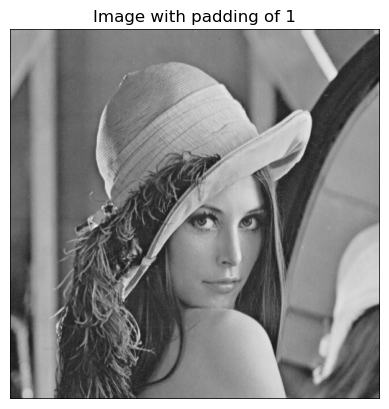

In [17]:
show_image(padded_img1,"Image with padding of 1")

## Question 1 part 1

In [18]:
filter_matrix1 = np.asarray([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1]
    ])

### Perform convulation

In [19]:
conv_img1 = conv(filter_matrix1,img_ndarray)

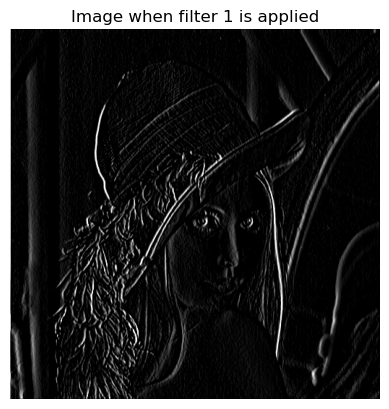

In [20]:
show_image(conv_img1,"Image when filter 1 is applied")

In [21]:
print(f"The array of image after convulation is : \n{conv_img1}")

The array of image after convulation is : 
[[ 324.    0.   -2. ...  -32.  -84. -310.]
 [ 486.    0.   -3. ...  -48. -126. -465.]
 [ 486.    0.   -3. ...  -48. -126. -465.]
 ...
 [ 133.   22.   15. ...    3.   -8. -303.]
 [ 131.   29.   33. ...   10.    2. -310.]
 [  88.   22.   29. ...   10.    8. -210.]]


## Question 1 part 2

In [22]:
filter_matrix2 = np.asarray([
    [1,1,1],[0,0,0],[-1,-1,-1]
])

In [23]:
print(filter_matrix2)

[[ 1  1  1]
 [ 0  0  0]
 [-1 -1 -1]]


In [24]:
conv_img2 = conv(filter_matrix2,img_ndarray)

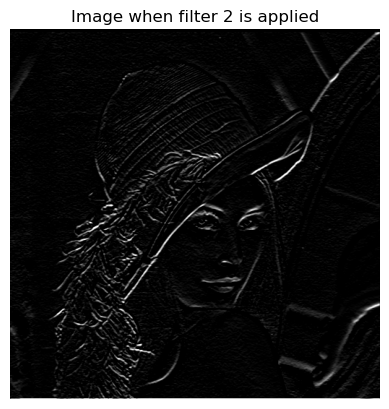

In [25]:
show_image(conv_img2,"Image when filter 2 is applied")

In [26]:
print(f"The array of image after convulation is : \n{conv_img2}")

The array of image after convulation is : 
[[-324. -486. -485. ... -496. -453. -283.]
 [   0.    0.    0. ...    0.    0.    0.]
 [   0.    0.    0. ...    0.    0.    0.]
 ...
 [   4.   -1.   -4. ...   -9.  -21.  -19.]
 [  -2.   -7.  -25. ...   -5.  -15.  -15.]
 [  88.  143.  150. ...  309.  317.  213.]]


## Question 1 Part 3

### Padding

In [27]:
padded_img2 = padding(img_ndarray,5)

In [28]:
print(padded_img2)

[[  0.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  0.   0. 162. ... 128.   0.   0.]
 ...
 [  0.   0.  44. ... 108.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ...   0.   0.   0.]]


In [29]:
print(f"The size of original image is {img_ndarray.shape} \nThe size of new image is {padded_img2.shape}")

The size of original image is (512, 512) 
The size of new image is (516, 516)


It can be seen that due to padding of 2 on both sides, we get size of padded image = size of image + 2

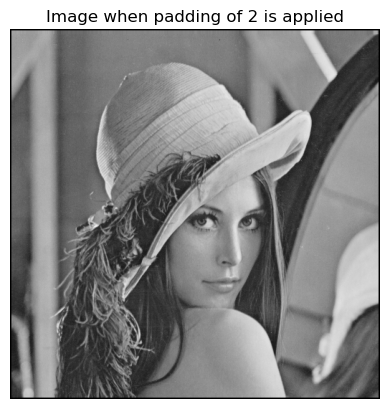

In [30]:
show_image(padded_img2,"Image when padding of 2 is applied")

### Convolution

In [31]:
filter_matrix3 = np.asarray([
    [-2,-1,0,1,2],
    [-2,-1,0,1,2],
    [-2,-1,0,1,2],
    [-2,-1,0,1,2],
    [-2,-1,0,1,2]
])

In [32]:
conv_img3 = conv(filter_matrix3,img_ndarray)

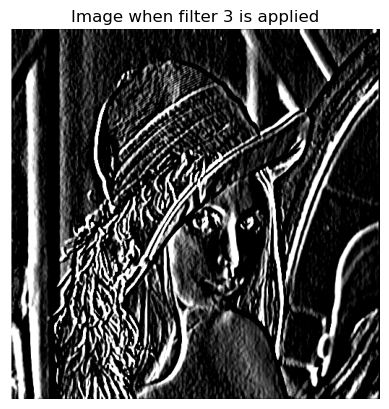

In [33]:
show_image(conv_img3,"Image when filter 3 is applied")

In [34]:
print(f"The array of image after convulation is : \n{conv_img3}")

The array of image after convulation is : 
[[ 1458.   966.    -3. ...  -294. -1152. -1485.]
 [ 1944.  1288.    -4. ...  -392. -1536. -1980.]
 [ 2430.  1610.    -5. ...  -490. -1920. -2475.]
 ...
 [  747.   549.   102. ...    42.  -987. -1516.]
 [  597.   461.   111. ...    34.  -804. -1236.]
 [  451.   357.    95. ...    30.  -598.  -934.]]


## Question 1 Part 4

In [35]:
filter_matrix4 = np.asarray([
    [2,2,2,2,2],
    [1,1,1,1,1],
    [0,0,0,0,0],
    [-1,-1,-1,-1,-1],
    [-2,-2,-2,-2,-2]
])

In [36]:
conv_img4 = conv(filter_matrix4,img_ndarray)

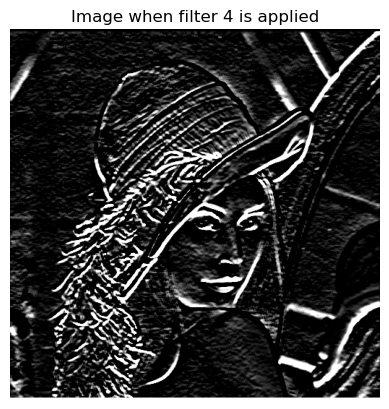

In [37]:
show_image(conv_img4,"Image when filter 4 is applied")

In [38]:
print(f"The array of image after convulation is : \n{conv_img4}")

The array of image after convulation is : 
[[-1458. -1941. -2427. ... -2379. -1872. -1359.]
 [ -972. -1294. -1618. ... -1586. -1248.  -906.]
 [    0.     0.     0. ...     0.     0.     0.]
 ...
 [   25.   -14.   -18. ...  -164.  -121.  -101.]
 [  277.   358.   462. ...   955.   777.   577.]
 [  415.   560.   722. ...  1517.  1221.   921.]]


# Question 2

### Function

In [39]:
def show_all(img, x, y, grad, dim):

    x= Image.fromarray(x)
    y= Image.fromarray(y)
    grad =Image.fromarray(grad)

    fig, axes = plt.subplots(2, 2, figsize=(7,7))
    
    # Show the original image
    axes[0,0].imshow(img, cmap="gray")
    axes[0,0].axis("off")
    axes[0,0].set_title("Original Image")
    
    # Show the 3x3 Sobel filtered image in x direction

    axes[0,1].imshow(x, cmap="gray")
    axes[0,1].axis("off")
    axes[0,1].set_title(f"{dim}x{dim} Sobel Filter in x direction")
    
    # Show the 5x5 Sobel filtered image
    axes[1,0].imshow(y, cmap="gray")
    axes[1,0].axis("off")
    axes[1,0].set_title(f"{dim}x{dim} Sobel Filter in y direction")
    
    # Show the 7x7 Sobel filtered image
    axes[1,1].imshow(grad, cmap="gray")
    axes[1,1].axis("off")
    axes[1,1].set_title(f"{dim}x{dim} Sobel Filter Gradient Magnitude")
    
    plt.suptitle("Comparison of Images")
    plt.tight_layout()
    plt.show()


### Question 2 part a(1)

In [40]:
sobel_filter_3x = np.asarray([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1]
])

In [41]:
sobel3x = conv(sobel_filter_3x,img_ndarray)

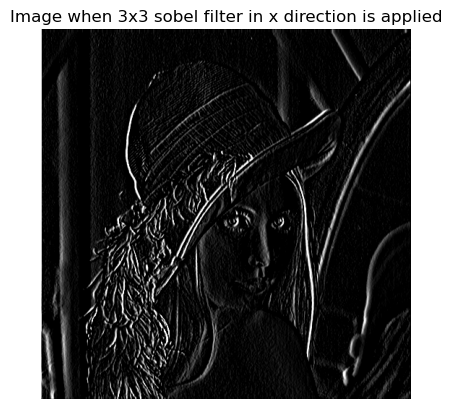

In [42]:
show_image(sobel3x,"Image when 3x3 sobel filter in x direction is applied")

### Question 2 part a(2)

In [43]:
sobel_filter_3y = np.asarray([
    [1,2,1],
    [0,0,0],
    [-1,-2,-1]
])

In [44]:
sobel3y = conv(sobel_filter_3y,img_ndarray)

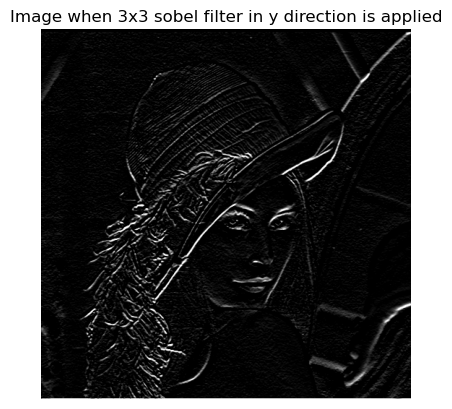

In [45]:
show_image(sobel3y,"Image when 3x3 sobel filter in y direction is applied")

### Question 2 part a (1) & (2) combine:

In [46]:
grad3 = grad_magnitude(sobel3x, sobel3y)

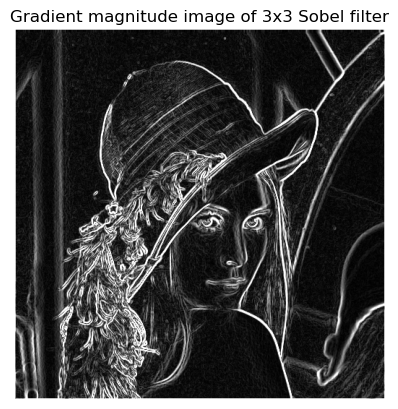

In [47]:
show_image(grad3,"Gradient magnitude image of 3x3 Sobel filter")

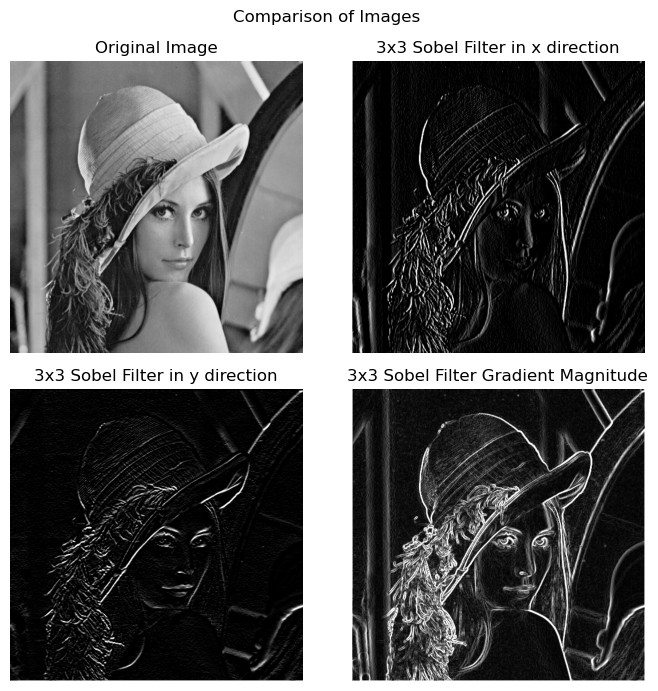

In [48]:
show_all(img, sobel3x, sobel3y, grad3, 3)

### Question 2 part a(3)

In [49]:
sobel_filter_5x = np.asarray([
    [1,2,3,2,1],
    [2,3,5,3,2],
    [0,0,0,0,0],
    [-2,-3,-5,-3,-2],
    [-1,-2,-3,-2,-1]
])

In [50]:
sobel5x = conv(sobel_filter_5x,img_ndarray)

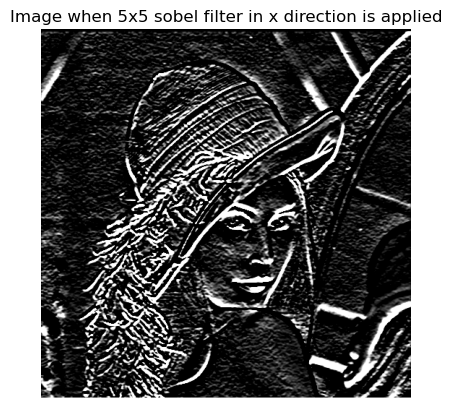

In [51]:
show_image(sobel5x,"Image when 5x5 sobel filter in x direction is applied")

### Question 2 part a(4)

In [52]:
sobel_filter_5y = np.asarray([
    [1,-2,0,2,1],
    [-2,-3,0,3,2],
    [-3,-5,0,5,3],
    [-2,-3,0,3,2],
    [-1,-2,0,2,1]
])

In [53]:
sobel5y = conv(sobel_filter_5y,img_ndarray)

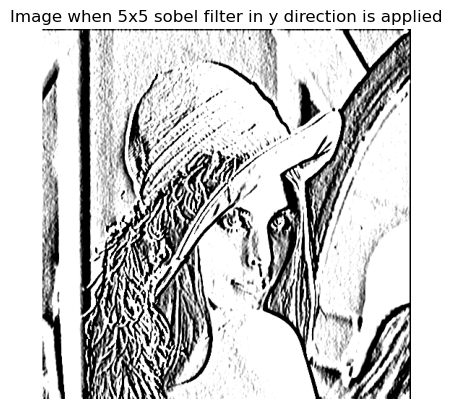

In [54]:
show_image(sobel5y,"Image when 5x5 sobel filter in y direction is applied")

### Question 2 part a (3) & (4) combine

In [55]:
grad5 = grad_magnitude(sobel5x, sobel5y)

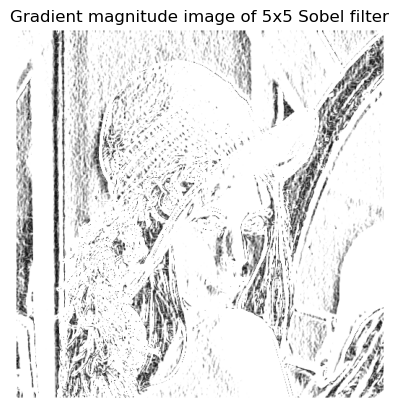

In [56]:
show_image(grad5,"Gradient magnitude image of 5x5 Sobel filter")

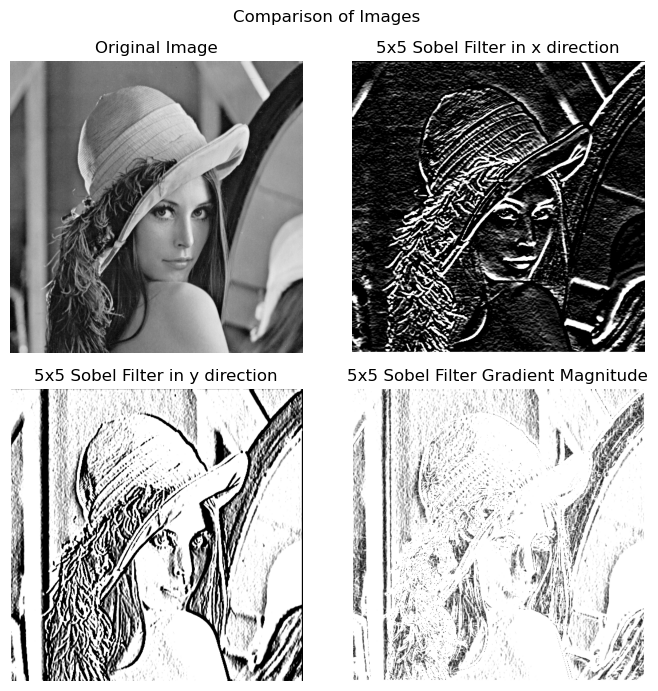

In [57]:
show_all(img, sobel5x, sobel5y, grad5,5)

## Finding the result for 7x7 sobel filter for comparision

In [58]:
sobel_filter_7x = np.array([
    [-3, 0, 1, 2, 1, 0, -3],
    [-7, 0, 3, 6, 3, 0, -7],
    [-10, 0, 5, 10, 5, 0, -10],
    [-12, 0, 6, 12, 6, 0, -12],
    [-10, 0, 5, 10, 5, 0, -10],
    [-7, 0, 3, 6, 3, 0, -7],
    [-3, 0, 1, 2, 1, 0, -3]
])

sobel_filter_7y = np.array([
    [1, 2, 3, 0, -3, -2, -1],
    [2, 6, 10, 0, -10, -6, -2],
    [3, 10, 15, 0, -15, -10, -3],
    [4, 12, 18, 0, -18, -12, -4],
    [3, 10, 15, 0, -15, -10, -3],
    [2, 6, 10, 0, -10, -6, -2],
    [1, 2, 3, 0, -3, -2, -1]
])


In [59]:
sobel7x = conv(sobel_filter_7x,img_ndarray)
sobel7y = conv(sobel_filter_7y,img_ndarray)

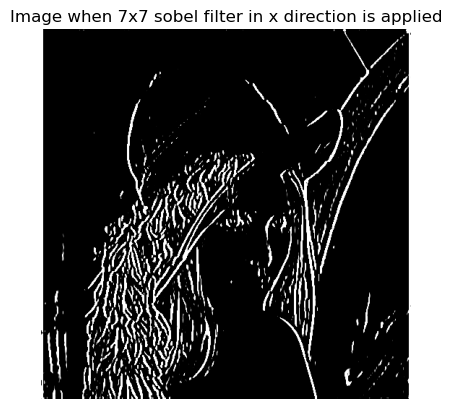

In [60]:
show_image(sobel7x,"Image when 7x7 sobel filter in x direction is applied")

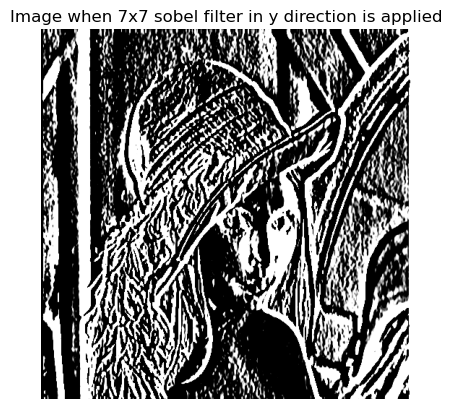

In [61]:
show_image(sobel7y,"Image when 7x7 sobel filter in y direction is applied")

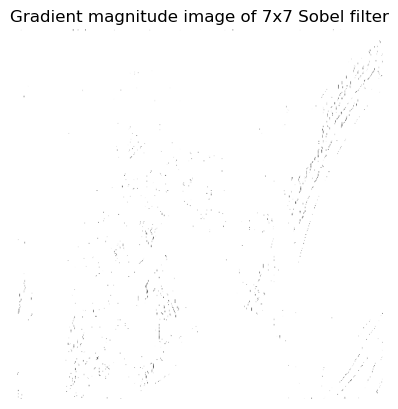

In [62]:
grad7 = grad_magnitude(sobel7x, sobel7y)
show_image(grad7,"Gradient magnitude image of 7x7 Sobel filter")

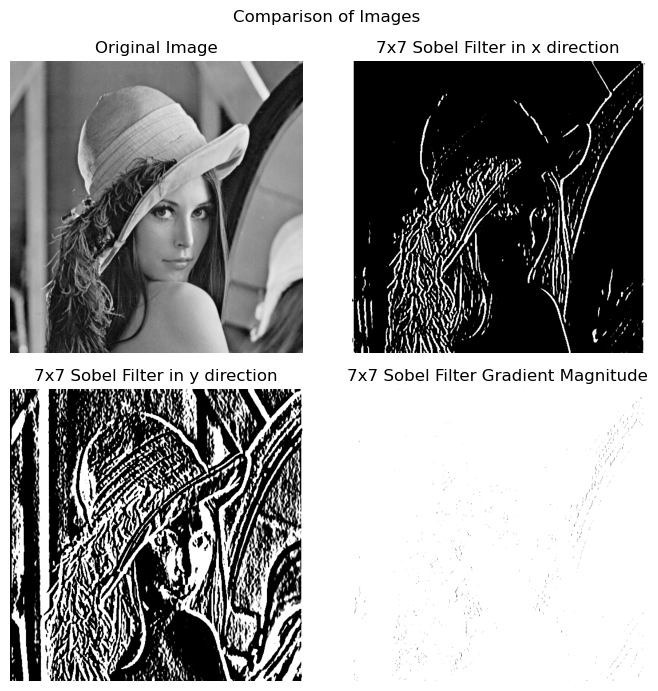

In [63]:
show_all(img, sobel7x, sobel7y, grad7,7)

In [64]:
def compare_sobel_filters(img, grad3, grad5, grad7):

    grad3= Image.fromarray(grad3)
    grad5= Image.fromarray(grad5)
    grad7 =Image.fromarray(grad7)
    
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    
    # Show the original image
    axes[0,0].imshow(img, cmap="gray")
    axes[0,0].axis("off")
    axes[0,0].set_title("Original Image")
    
    # Show the 3x3 Sobel filtered image
    axes[0,1].imshow(grad3, cmap="gray")
    axes[0,1].axis("off")
    axes[0,1].set_title("3x3 Sobel Filter")
    
    # Show the 5x5 Sobel filtered image
    axes[1,0].imshow(grad5, cmap="gray")
    axes[1,0].axis("off")
    axes[1,0].set_title("5x5 Sobel Filter")
    
    # Show the 7x7 Sobel filtered image
    axes[1,1].imshow(grad7, cmap="gray")
    axes[1,1].axis("off")
    axes[1,1].set_title("7x7 Sobel Filter")
    
    plt.suptitle("Comparison of Original and Gradient Magnitude Images using Sobel Filters")
    plt.tight_layout()
    plt.show()


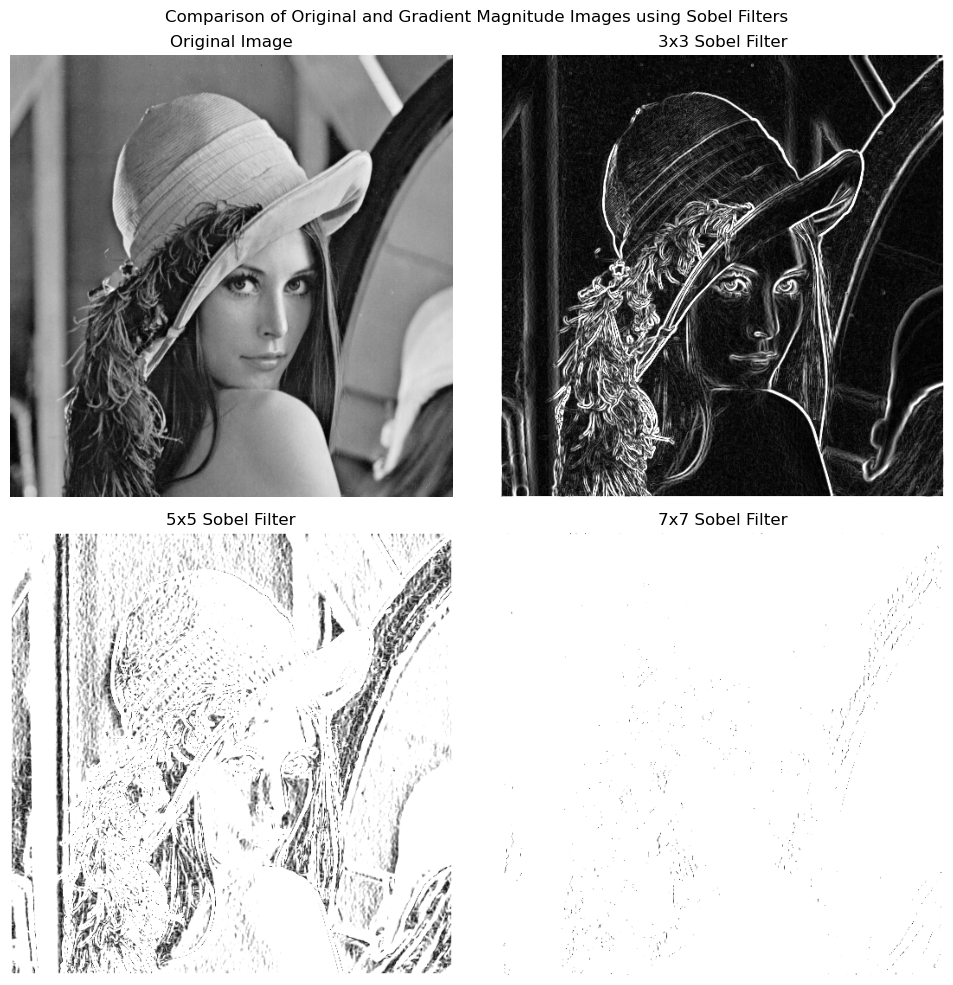

In [65]:
compare_sobel_filters(img, grad3, grad5, grad7)

## Question 2 part (c)

### Applying different thresholding and observing:

In [66]:
def compare_threshold(grad,threshold,s):
    d = {}

    grad1= Image.fromarray(grad)
    fig, axes = plt.subplots(2,3, figsize=(15, 10))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy indexing
    axes[0].imshow(grad1, cmap='gray')
    axes[0].set_title("Gradient Magnitude Image")
    axes[0].axis('off')
    
    for j, i in enumerate(threshold, start=1):   #j is the index and i is the value. value of j starts from 1.
        title = f"Image when threshold = {i}"
        d[i] = np.where(grad > i, 255, 0)  #It sets values in the d array to 255 where grad > i and 0 where grad < i.
        ax = axes[j]
        ax.imshow(d[i], cmap='gray')
        ax.set_title(title)
        ax.axis('off')  

    plt.suptitle(f"Thresholding on the gradient magnitude image of {s}x{s} Sobel filter to create a binary edge image")
    plt.tight_layout()
    plt.show()

In [67]:
threshold = [50,100,150,200,250]

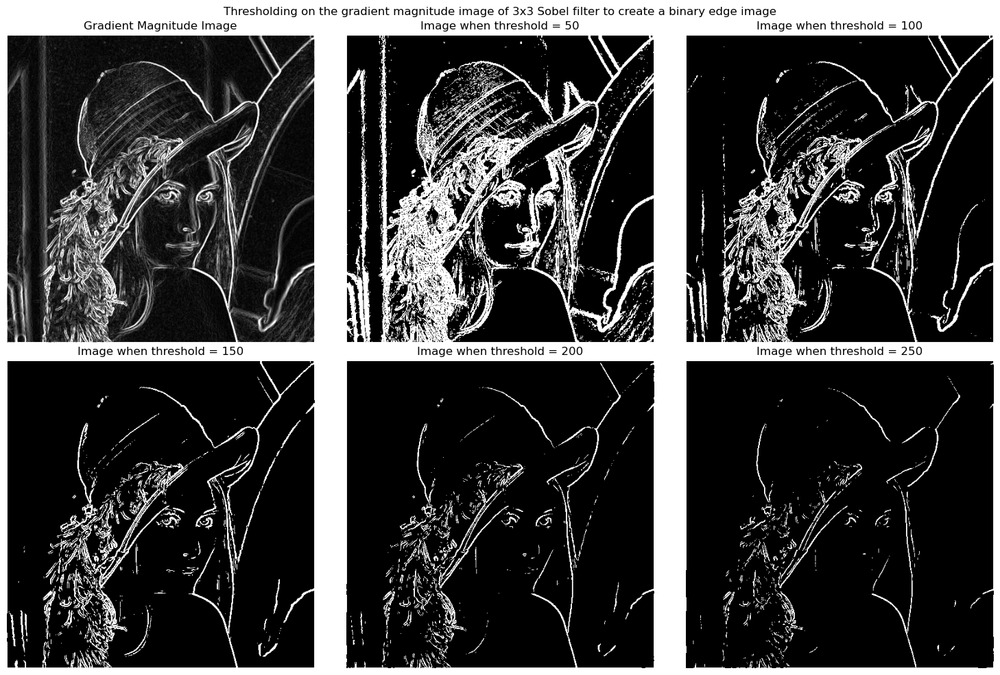

In [68]:
compare_threshold(grad3,threshold,3)

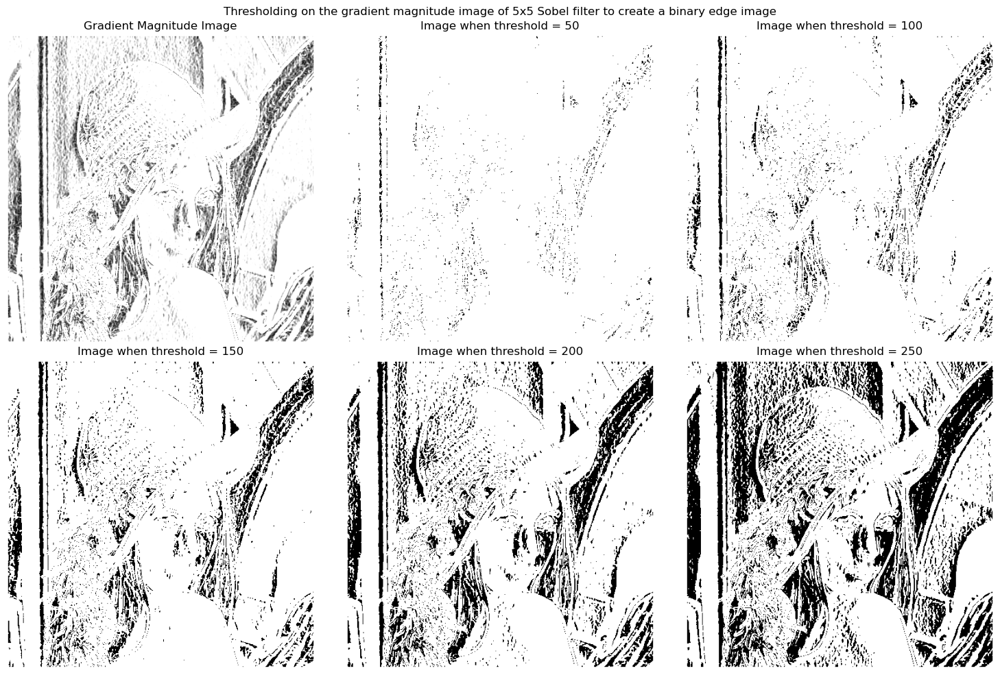

In [69]:
compare_threshold(grad5,threshold,5)

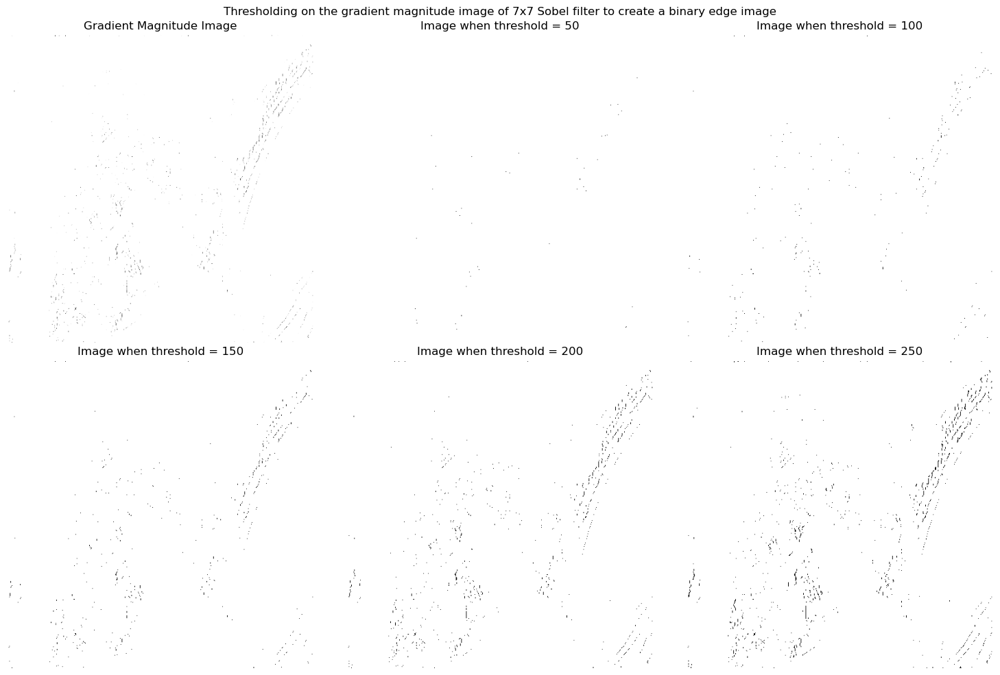

In [70]:
compare_threshold(grad7,threshold,7)

## Question 2 part (d)

### Adding noise

In [71]:
def add_gaussian_noise(img_ndarray,sigma,mean):

    size = img_ndarray.shape
    noise = np.random.normal(mean, sigma, size)  #Draw random samples from a normal (Gaussian) distribution.
    noisy_img = img_ndarray + noise   #add noise to the image
    return noisy_img

In [72]:
noisy_img = add_gaussian_noise(img_ndarray, 25, 0)

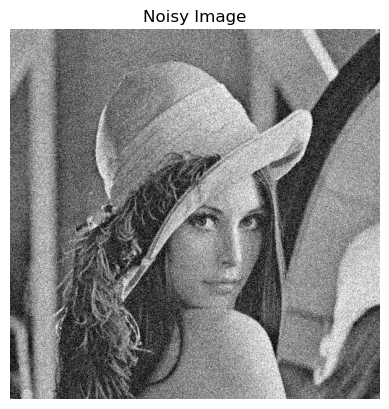

In [73]:
show_image(noisy_img,"Noisy Image")

### Applying sobel 3x3 filter to a noisy image.

In [74]:
sobel3x_noisy = conv(sobel_filter_3x,noisy_img)
sobel3y_noisy = conv(sobel_filter_3y,noisy_img)

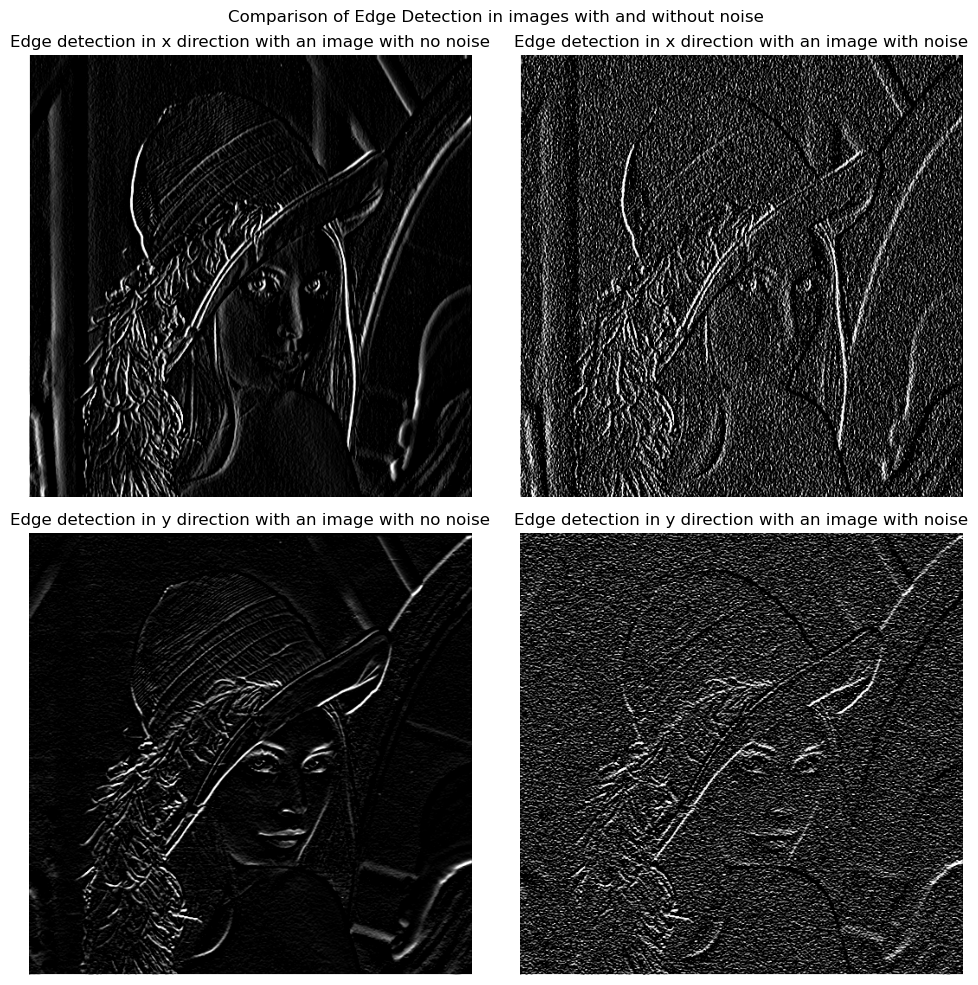

In [75]:
sobel3x_noisy =Image.fromarray(sobel3x_noisy)
sobel3x =Image.fromarray(sobel3x)
sobel3y_noisy =Image.fromarray(sobel3y_noisy)
sobel3y =Image.fromarray(sobel3y)
    
fig, axes = plt.subplots(2, 2, figsize=(10,10))
        
axes[0,0].imshow(sobel3x, cmap="gray")
axes[0,0].axis("off")
axes[0,0].set_title("Edge detection in x direction with an image with no noise")
            
axes[0,1].imshow(sobel3x_noisy, cmap="gray")
axes[0,1].axis("off")
axes[0,1].set_title("Edge detection in x direction with an image with noise")
            
axes[1,0].imshow(sobel3y, cmap="gray")
axes[1,0].axis("off")
axes[1,0].set_title("Edge detection in y direction with an image with no noise")
            
axes[1,1].imshow(sobel3y_noisy, cmap="gray")
axes[1,1].axis("off")
axes[1,1].set_title("Edge detection in y direction with an image with noise")
            
plt.suptitle("Comparison of Edge Detection in images with and without noise")
plt.tight_layout()
plt.show()


# Question 3

### Functions

In [76]:
def gaussian_fn (x, y, sigma):
    #function to calculate the gaussian function
    sq = pow(sigma,2)
    n = (1/(2* (np.pi) * sq))
    num = (pow(x,2) + pow(y,2) )
    den = 2 * sq
    f = num/den
    e = exp(-f)
    return n*e

In [77]:
def g_filter(size_of_filter, sigma):
    g_filter = np.zeros((size_of_filter, size_of_filter))  # Initialize a square filter with zeros
    for i in range(size_of_filter):  
        for j in range(size_of_filter):
            g_filter[i, j] = gaussian_fn(i - size_of_filter // 2, j - size_of_filter // 2, sigma)  # (x,y) would be the distance from the center of the filter
    sum = np.sum(g_filter)  #for normalization
    return g_filter/(sum)

In [78]:
def gaussian_smoothing (size, sigma, img_ndarray):
    f = g_filter(size,sigma)    #getting the gaussian filter
    return conv(f,img_ndarray)  #performing convolution

In [87]:
def zero_crossing(img):
    laplacian_kernel = np.array([[0, 1, 0],           #Laplacian Kernel
                                [1, -4, 1],
                                [0, 1, 0]])
    laplacian_image = conv(laplacian_kernel, img)     #Performing Convolution
    
    (ih,iw)=laplacian_image.shape
    zero = np.full((ih,iw),255)
    
    for i in range(1,ih-1):
        for j in range(1,iw-1):
            a = laplacian_image[i-1:i+2,j-1:j+2]     #Region of Interest
            mina = a.min()                           #max value
            maxa = a.max()                           #min value

            if mina<0 and maxa > 0:                  #if sign changes, it means it crossed zero.
                zero[i,j] = 0                        #if crossed zero, asign value 0 in the matrix

    return zero

### Question 3(a)

In [88]:
smooth_img = gaussian_smoothing(3,1,img_ndarray)

Text(0.5, 1.0, 'Smooth Image')

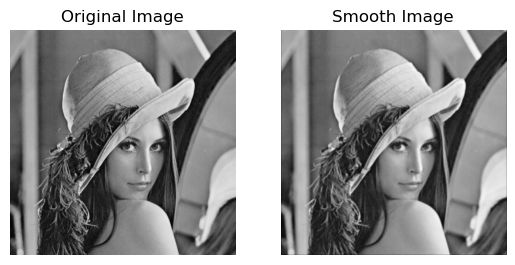

In [81]:
f, axes = plt.subplots(1,2)
axes[0].imshow(img_ndarray,cmap="gray")
axes[0].axis("off")
axes[0].set_title("Original Image")
axes[1].imshow(smooth_img,cmap="gray")
axes[1].axis("off")
axes[1].set_title("Smooth Image")

### Question 3(b)

In [89]:
zero_cross1 = zero_crossing(smooth_img)  #LoG on smooth image

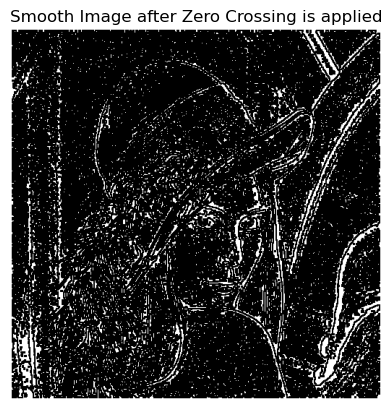

In [90]:
show_image(zero_cross1, "Smooth Image after Zero Crossing is applied")

Text(0.5, 1.0, 'zero-crossings Image')

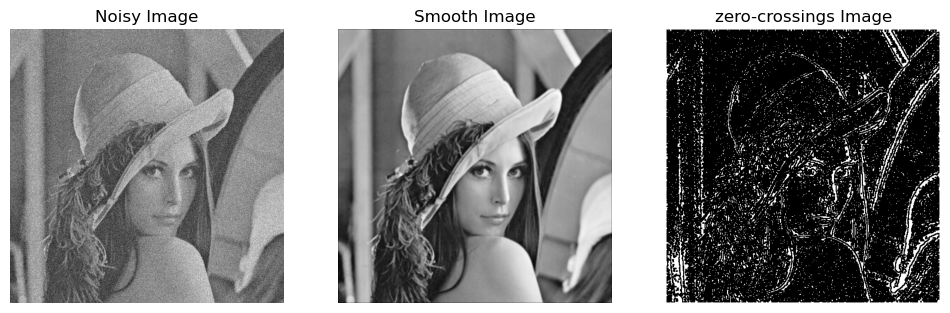

In [99]:
f, axes = plt.subplots(1,3,figsize=(12,10))
axes[0].imshow(noisy_img,cmap="gray")
axes[0].axis("off")
axes[0].set_title("Noisy Image")
axes[1].imshow(smooth_img,cmap="gray")
axes[1].axis("off")
axes[1].set_title("Smooth Image")
axes[2].imshow(zero_cross1,cmap="gray")
axes[2].axis("off")
axes[2].set_title("zero-crossings Image")

### Question 3 part (c)

In [91]:
zero_cross2 = zero_crossing(img_ndarray)   #LoG on original image

Text(0.5, 1.0, 'Edges detected from Non Smoothed Image')

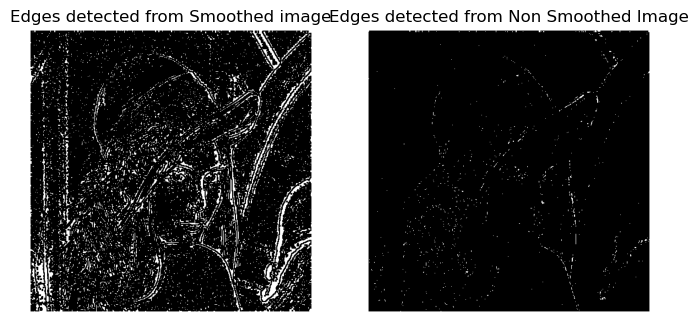

In [92]:
f, axes = plt.subplots(1,2,figsize=(8,8))
axes[0].imshow(zero_cross1,cmap="gray")
axes[0].axis("off")
axes[0].set_title("Edges detected from Smoothed image")
axes[1].imshow(zero_cross2,cmap="gray")
axes[1].axis("off")
axes[1].set_title("Edges detected from Non Smoothed Image")